In [1]:
!pip install pycaret --user
!pip install markupsafe==2.0.1

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Using cached MarkupSafe-2.1.1-cp37-cp37m-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (25 kB)
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
datascience 0.10.6 requires folium==0.2.1, but you have folium 0.8.3 which is incompatible.
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Using cached MarkupSafe-2.0.1-cp37-cp37m-manylinux_2_5_x86_64.manylinux1_x86_64.manylinux_2_12_x86_64.manylinux2010_x86_64.whl (31 kB)
  Attempting uninstall: markupsafe
    Found existing installation: MarkupSafe 2.1.1
    Uninstalling MarkupSafe-2.1.1:
      Successfully uninstalled MarkupSafe-2.1.1
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the sou

In [2]:
# Imports
from pycaret.clustering import *
import pandas as pd
import seaborn as sns

/usr/local/lib/python3.7/dist-packages/distributed/config.py:20: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  defaults = yaml.load(f)


In [4]:
# Importando os dados
dataset = pd.read_csv('/content/bankmarketing.csv')
dataset.head()

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,261,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
1,57,services,married,high.school,unknown,no,no,telephone,may,mon,149,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
2,37,services,married,high.school,no,yes,no,telephone,may,mon,226,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,151,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
4,56,services,married,high.school,no,no,yes,telephone,may,mon,307,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no


In [5]:
# Informações 
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41188 entries, 0 to 41187
Data columns (total 21 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   age             41188 non-null  int64  
 1   job             41188 non-null  object 
 2   marital         41188 non-null  object 
 3   education       41188 non-null  object 
 4   default         41188 non-null  object 
 5   housing         41188 non-null  object 
 6   loan            41188 non-null  object 
 7   contact         41188 non-null  object 
 8   month           41188 non-null  object 
 9   day_of_week     41188 non-null  object 
 10  duration        41188 non-null  int64  
 11  campaign        41188 non-null  int64  
 12  pdays           41188 non-null  int64  
 13  previous        41188 non-null  int64  
 14  poutcome        41188 non-null  object 
 15  emp.var.rate    41188 non-null  float64
 16  cons.price.idx  41188 non-null  float64
 17  cons.conf.idx   41188 non-null 

In [6]:
# Forma dos dados
dataset.shape

(41188, 21)

In [7]:
# Configurando o ambiente
exp_clu101 = setup(
                     data = dataset
                    ,profile = True
                    ,session_id = 123
                )

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [8]:
from pycaret.clustering import *

exp_clu101 = setup(
                     data = dataset
                    ,profile = False
                    ,session_id = 123
                    ,normalize = True
                    ,ordinal_features = {'education' : 
                                         [ 
                                              'unknown'
                                             ,'illiterate'
                                             ,'basic.4y'
                                             ,'basic.6y'
                                             ,'basic.9y'
                                             ,'high.school'
                                             ,'professional.course'
                                             ,'university.degree'
                                         ]
                                      }
                    ,high_cardinality_features = ["duration"]
                    ,high_cardinality_method = "frequency"
                    ,ignore_low_variance = True
                    ,combine_rare_levels = True
                    ,rare_level_threshold = 0.30
                    ,remove_perfect_collinearity = True
                )

,Description,Value
0,session_id,123
1,Original Data,"(41188, 21)"
2,Missing Values,False
3,Numeric Features,9
4,Categorical Features,12
5,Ordinal Features,True
6,High Cardinality Features,True
7,High Cardinality Method,frequency
8,Transformed Data,"(41188, 51)"
9,CPU Jobs,-1


In [9]:
# Armazenando o Dataframe transformado
df_transformed = get_config('X')
df_transformed.head()

,age,education,duration,campaign,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,job_admin.,...,day_of_week_wed,previous_0,previous_1,previous_2,previous_3,previous_4,previous_others_infrequent,poutcome_failure,poutcome_success,y_no
0,1.533034,2.0,-0.541089,-0.565922,0.648092,0.722729,0.886446,0.71246,0.331679,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1,1.628993,5.0,0.610086,-0.565922,0.648092,0.722729,0.886446,0.71246,0.331679,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
2,-0.290186,5.0,0.084988,-0.565922,0.648092,0.722729,0.886446,0.71246,0.331679,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
3,-0.002309,3.0,0.812047,-0.565922,0.648092,0.722729,0.886446,0.71246,0.331679,1.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
4,1.533034,5.0,-1.045991,-0.565922,0.648092,0.722729,0.886446,0.71246,0.331679,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


In [10]:
# Forma dos dados transformado
df_transformed.shape

(41188, 51)

In [11]:
# Verificando a lista de modelos disponiveis
models()

,Name,Reference
ID,,
kmeans,K-Means Clustering,sklearn.cluster._kmeans.KMeans
ap,Affinity Propagation,sklearn.cluster._affinity_propagation.Affinity...
meanshift,Mean Shift Clustering,sklearn.cluster._mean_shift.MeanShift
sc,Spectral Clustering,sklearn.cluster._spectral.SpectralClustering
hclust,Agglomerative Clustering,sklearn.cluster._agglomerative.AgglomerativeCl...
dbscan,Density-Based Spatial Clustering,sklearn.cluster._dbscan.DBSCAN
optics,OPTICS Clustering,sklearn.cluster._optics.OPTICS
birch,Birch Clustering,sklearn.cluster._birch.Birch
kmodes,K-Modes Clustering,kmodes.kmodes.KModes


In [12]:
# Criando o modelo Kmeans
kmeans = create_model('kmeans')

# Print
print(kmeans)

,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1837,8251.3692,1.8297,0,0,0


KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=4, n_init=10, n_jobs=-1, precompute_distances='deprecated',
       random_state=123, tol=0.0001, verbose=0)


In [13]:
# Atribuindo o cluster aos dados
kmean_results = assign_model(kmeans)
kmean_results.head()

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y,Cluster
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,...,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no,Cluster 1
1,57,services,married,high.school,unknown,no,no,telephone,may,mon,...,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no,Cluster 2
2,37,services,married,high.school,no,yes,no,telephone,may,mon,...,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no,Cluster 2
3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,...,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no,Cluster 1
4,56,services,married,high.school,no,no,yes,telephone,may,mon,...,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no,Cluster 2


In [16]:
# Cluster PCA plot
plot_model(kmeans)

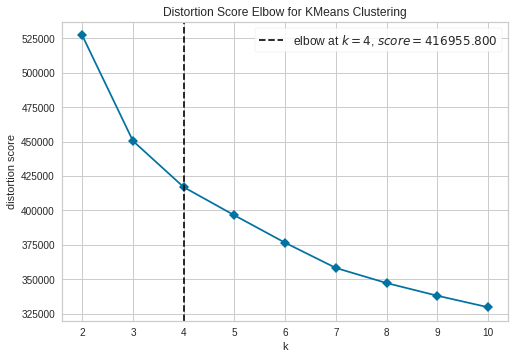

In [15]:
# Elbow plot
plot_model(kmeans, plot='elbow')

In [17]:
# Distribution plot
plot_model(kmeans, plot='distribution')

In [19]:
# Tuned do modelo de agrupamento para a tarefa de classificação
tuned_kmeans = tune_model(model='kmeans', supervised_target='y')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.8978,0.8820,0.1454,0.3844,0.1609,0.1061,0.1298
2,0.8982,0.8795,0.1547,0.3770,0.1779,0.1226,0.1460
4,0.8986,0.8811,0.1488,0.3365,0.1683,0.1141,0.1369
5,0.8988,0.8811,0.1493,0.3927,0.1686,0.1145,0.1397
6,0.8981,0.8806,0.1503,0.3759,0.1697,0.1147,0.1389
8,0.8981,0.8788,0.1524,0.2748,0.1749,0.1197,0.1378
10,0.8979,0.8808,0.1550,0.3524,0.1745,0.1188,0.1446
14,0.8979,0.8775,0.1545,0.3440,0.1741,0.1180,0.1435
18,0.8989,0.8811,0.1489,0.3688,0.1684,0.1145,0.1361
25,0.9013,0.8812,0.1484,0.3367,0.1811,0.1304,0.1536


In [20]:
# Verificando o objeto
tuned_kmeans

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=40, n_init=10, n_jobs=-1, precompute_distances='deprecated',
       random_state=123, tol=0.0001, verbose=0)

In [21]:
# Salvando o modelo em disco
save_model(kmeans, 'kmeans_model')

Transformation Pipeline and Model Successfully Saved


(Pipeline(memory=None,
          steps=[('dtypes',
                  DataTypes_Auto_infer(categorical_features=[],
                                       display_types=True, features_todrop=[],
                                       id_columns=[], ml_usecase='regression',
                                       numerical_features=[],
                                       target='UNSUPERVISED_DUMMY_TARGET',
                                       time_features=[])),
                 ('imputer',
                  Simple_Imputer(categorical_strategy='most frequent',
                                 fill_value_categorical=None,
                                 fill_value_numerical=None...
                 ('fix_perfect', Remove_100(target='UNSUPERVISED_DUMMY_TARGET')),
                 ('clean_names', Clean_Colum_Names()),
                 ('feature_select', 'passthrough'), ('fix_multi', 'passthrough'),
                 ('dfs', 'passthrough'), ('pca', 'passthrough'),
                 ['trai